Set colab to access the images in Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow

Import the required libraries

In [ ]:
import os   # To navigate into the drive folders and access the images
import matplotlib.pyplot as plt   # To make plots
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator  # To process images in batches and apply transformations
from keras.applications import VGG19   # Import the VGG19 model
from keras.models import Sequential    # Allow us to add another layer to the pretrained model that makes the classification
from keras.layers import Flatten, Dense, Dropout   # Flatten the output layer to make it able for input in the Dense layer
from keras.optimizers import Adam    # Import the Adam optimizer


Defining paths to our images

In [ ]:
# Define the base directory where your 'sample' folder is located
base_dir = '/content/drive/My Drive/Sample'

# Define the paths to the training, validation, and testing directories
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

## Base model

Data normalization and ImageDataGenerator instances to access the images.

In [ ]:
# Rescale the pixel values from [0, 255] to [0, 1] for normalization

train_datagen = ImageDataGenerator(rescale=1./255)

validation_datagen  = ImageDataGenerator(rescale=1./255)
test_datagen  = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=32,  # It will be iterating from batches of 20 images
    class_mode= 'binary'  # Label the images in a binary way (Fake or Real)
)

Validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=32,  # It will be iterating from batches of 20 images
    class_mode= 'binary'  # Label the images in a binary way (Fake or Real)
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=20,  # It will be iterating from batches of 20 images
    class_mode= 'binary',  # Label the images in a binary way (Fake or Real)
    shuffle=False)  # No need to shuffle the test data

Found 2999 images belonging to 2 classes.
Found 802 images belonging to 2 classes.
Found 600 images belonging to 2 classes.


Here we defined the first model, calling VGG19 model with the weights resulted in the training on the imagenet dataset.

In [ ]:
# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False

# Create a new Sequential model and add the VGG19 base model without dropout
model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])


Given a binary classification we used binary cross entropy as the loss function and ADAM as the activation function.

In [ ]:
# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-4),
               loss='binary_crossentropy',
               metrics=['accuracy'])

Now we do the training of our first model on 10 epochs


In [ ]:
# Model training
num_epochs = 10

history = model.fit(
    train_generator,
    steps_per_epoch= 40,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 5
)

Epoch 1/10
40/40 [==============================] - 447s 11s/step - loss: 0.6159 - accuracy: 0.6650 - val_loss: 0.5263 - val_accuracy: 0.7900
Epoch 2/10
40/40 [==============================] - 61s 2s/step - loss: 0.3647 - accuracy: 0.8562 - val_loss: 0.3627 - val_accuracy: 0.8600
Epoch 3/10
40/40 [==============================] - 34s 851ms/step - loss: 0.2506 - accuracy: 0.9212 - val_loss: 0.3752 - val_accuracy: 0.8500
Epoch 4/10
40/40 [==============================] - 27s 675ms/step - loss: 0.1891 - accuracy: 0.9488 - val_loss: 0.3955 - val_accuracy: 0.8200
Epoch 5/10
40/40 [==============================] - 25s 622ms/step - loss: 0.1706 - accuracy: 0.9538 - val_loss: 0.3630 - val_accuracy: 0.8400
Epoch 6/10
40/40 [==============================] - 21s 528ms/step - loss: 0.1118 - accuracy: 0.9812 - val_loss: 0.4015 - val_accuracy: 0.8200
Epoch 7/10
40/40 [==============================] - 24s 590ms/step - loss: 0.0891 - accuracy: 0.9937 - val_loss: 0.3675 - val_accuracy: 0.8300
Epo

Here there is another try including early stopping and normalization


In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(
    train_generator,
    steps_per_epoch= 40,   # Batch size is 20, 20 times 40 is 800, the size of the training data
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 5,
    callbacks=[early_stopping]
)

Epoch 1/20
40/40 [==============================] - 23s 534ms/step - loss: 3.4929 - accuracy: 0.6350 - val_loss: 1.6430 - val_accuracy: 0.7000
Epoch 2/20
40/40 [==============================] - 20s 507ms/step - loss: 1.1184 - accuracy: 0.8313 - val_loss: 1.0748 - val_accuracy: 0.7400
Epoch 3/20
40/40 [==============================] - 21s 519ms/step - loss: 0.6977 - accuracy: 0.9237 - val_loss: 0.9045 - val_accuracy: 0.7200
Epoch 4/20
40/40 [==============================] - 21s 524ms/step - loss: 0.5310 - accuracy: 0.9450 - val_loss: 0.6048 - val_accuracy: 0.8800
Epoch 5/20
40/40 [==============================] - 21s 512ms/step - loss: 0.4317 - accuracy: 0.9638 - val_loss: 0.5679 - val_accuracy: 0.8400
Epoch 6/20
40/40 [==============================] - 22s 558ms/step - loss: 0.3762 - accuracy: 0.9613 - val_loss: 0.5642 - val_accuracy: 0.8500
Epoch 7/20
40/40 [==============================] - 21s 536ms/step - loss: 0.3594 - accuracy: 0.9538 - val_loss: 0.5607 - val_accuracy: 0.8500

# Bigger sample including data augmentation (4000 images)

To reduce the overfitting we are runing the model with bigger sample and see the performance, redefining the model to take the sample from the root folders of real and fake images. Early stopping and L2 regularization is going to be used to avoid overfitting. Data normalization and ImageDataGenerator instances to access the images. Data augmentation is applied in the training dataset with rotations, shifts and flips.


In [ ]:
# Rescale the pixel values from [0, 255] to [0, 1] for normalization

train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

validation_datagen  = ImageDataGenerator(rescale=1./255)
test_datagen  = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=32,  # It will be iterating from batches of 20 images
    class_mode= 'binary'  # Label the images in a binary way (Fake or Real)
)

Validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=32,  # It will be iterating from batches of 20 images
    class_mode= 'binary'  # Label the images in a binary way (Fake or Real)
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),   # This is the input size required for the VGG19 model
    batch_size=20,  # It will be iterating from batches of 20 images
    class_mode= 'binary',  # Label the images in a binary way (Fake or Real)
    shuffle=False)  # No need to shuffle the test data

Found 3399 images belonging to 2 classes.
Found 802 images belonging to 2 classes.
Found 600 images belonging to 2 classes.


### Base model, early stopping and dropout. Accuracy 0.87

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.001)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.001))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 40,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 5,
    callbacks=[early_stopping, model_checkpoint]
)


Epoch 1/20
40/40 [==============================] - ETA: 0s - loss: 1.4348 - accuracy: 0.6506
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_01_val_accuracy_0.6875.h5
40/40 [==============================] - 11s 252ms/step - loss: 1.4348 - accuracy: 0.6506 - val_loss: 0.8791 - val_accuracy: 0.6875
Epoch 2/20
40/40 [==============================] - ETA: 0s - loss: 0.6746 - accuracy: 0.7932
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_02_val_accuracy_0.7563.h5
40/40 [==============================] - 10s 251ms/step - loss: 0.6746 - accuracy: 0.7932 - val_loss: 0.6751 - val_accuracy: 0.7563
Epoch 3/20
40/40 [==============================] - ETA: 0s - loss: 0.5958 - accuracy: 0.8008
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_03_val_accuracy_0.7688.h5
40/40 [==============================] - 10s 247ms/step - loss: 0.5958 - accuracy: 0.8008 - val_loss: 0.6597 - val_accura

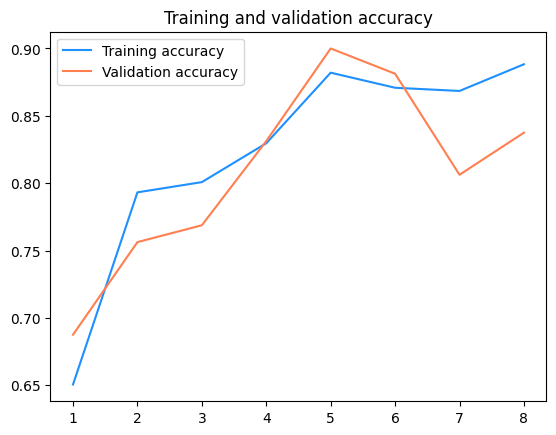

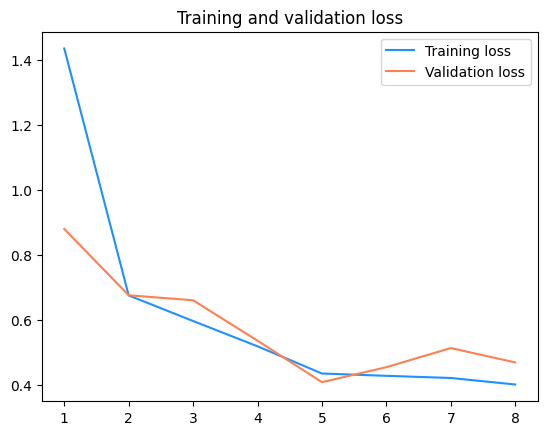

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()


In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_05_val_accuracy_0.9000.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
19/19 [==============================] - 3s 160ms/step - loss: 0.4699 - accuracy: 0.8750
Test loss: 0.4699, Test accuracy: 0.8750


30/30 [==============================] - 15s 319ms/step


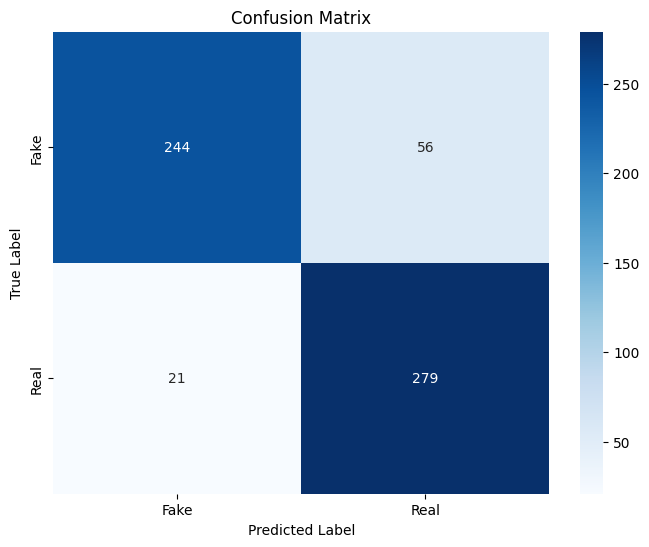

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get the true labels and predictions
true_labels = test_generator.classes
predictions = model.predict(test_generator)
predicted_labels = np.where(predictions > 0.5, 1, 0).flatten()

# Compute the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

def plot_confusion_matrix(conf_matrix, class_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Plot the confusion matrix
class_names = ['Fake', 'Real']  # Adjust based on your classes
plot_confusion_matrix(conf_matrix, class_names)

### Basic model 88 steps per epoch, dropot 0.3. Accuracy 0.85

Now I am setting the steps per epoch to run over the entire dataset, restincting more the training with more dropout and lambda value in regularization

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.3),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 15
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/15
88/88 [==============================] - ETA: 0s - loss: 2.2738 - accuracy: 0.6698
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_01_val_accuracy_0.8080.h5
88/88 [==============================] - 25s 268ms/step - loss: 2.2738 - accuracy: 0.6698 - val_loss: 0.9198 - val_accuracy: 0.8080
Epoch 2/15
88/88 [==============================] - ETA: 0s - loss: 0.7708 - accuracy: 0.7902
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_02_val_accuracy_0.8254.h5
88/88 [==============================] - 23s 259ms/step - loss: 0.7708 - accuracy: 0.7902 - val_loss: 0.6400 - val_accuracy: 0.8254
Epoch 3/15
88/88 [==============================] - ETA: 0s - loss: 0.6173 - accuracy: 0.8059
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_03_val_accuracy_0.8429.h5
88/88 [==============================] - 23s 261ms/step - loss: 0.6173 - accuracy: 0.8059 - val_loss: 0.5683 - val_acc

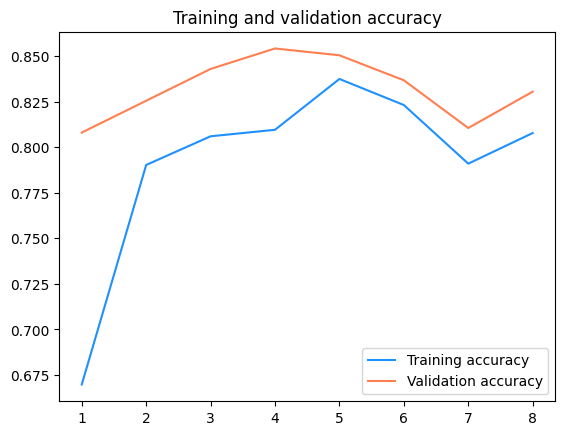

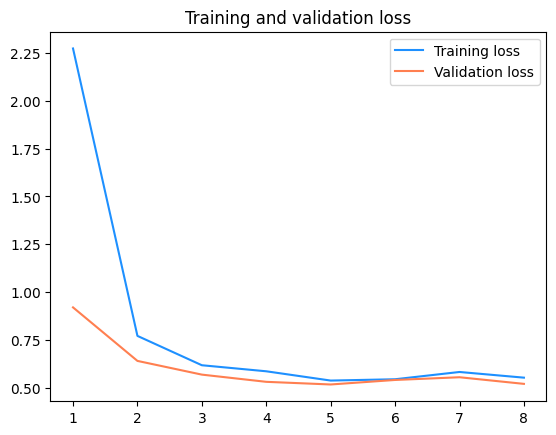

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Now we are going to test some models:

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_06_val_accuracy_0.8367.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')


Found 600 files belonging to 2 classes.
19/19 [==============================] - 4s 175ms/step - loss: 0.5354 - accuracy: 0.8533
Test loss: 0.5354, Test accuracy: 0.8533


30/30 [==============================] - 10s 324ms/step


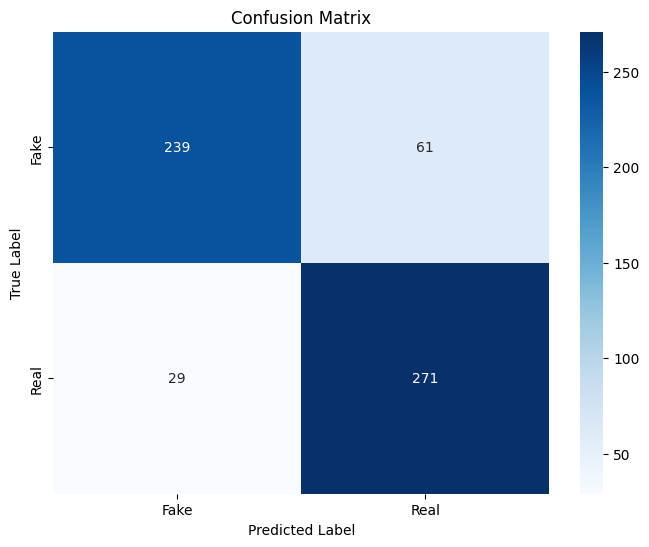

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get the true labels and predictions
true_labels = test_generator.classes
predictions = model.predict(test_generator)
predicted_labels = np.where(predictions > 0.5, 1, 0).flatten()

# Compute the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

def plot_confusion_matrix(conf_matrix, class_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Plot the confusion matrix
class_names = ['Fake', 'Real']  # Adjust based on your classes
plot_confusion_matrix(conf_matrix, class_names)

### Base model dropout 0.2 and regularization 0.01. Acc 0.80

We will try to tune the model to improve the results

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-4),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 15
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

80134624/80134624 [==============================] - 0s 0us/step
Epoch 1/15
88/88 [==============================] - ETA: 0s - loss: 3.9937 - accuracy: 0.6265
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_01_val_accuracy_0.7157.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 616s 7s/step - loss: 3.9937 - accuracy: 0.6265 - val_loss: 2.6985 - val_accuracy: 0.7157
Epoch 2/15
88/88 [==============================] - ETA: 0s - loss: 2.2195 - accuracy: 0.6880
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_02_val_accuracy_0.7743.h5
88/88 [==============================] - 56s 633ms/step - loss: 2.2195 - accuracy: 0.6880 - val_loss: 1.7758 - val_accuracy: 0.7743
Epoch 3/15
88/88 [==============================] - ETA: 0s - loss: 1.6465 - accuracy: 0.7134
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_03_val_accuracy_0.7519.h5
88/88 [==============================] - 57s 646ms/step - loss: 1.6465 - accuracy: 0.7134 - val_loss: 1.4242 - val_accuracy: 0.7519
Epoch 4/15
88/88 [==============================] - ETA: 0s - loss: 1.3641 - accuracy: 0.7316
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_04_val_accurac

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-4),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 15
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=Validation_generator,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/15
94/94 [==============================] - ETA: 0s - loss: 3.8163 - accuracy: 0.6816
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_01_val_accuracy_0.7918.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


94/94 [==============================] - 914s 10s/step - loss: 3.8163 - accuracy: 0.6816 - val_loss: 2.4066 - val_accuracy: 0.7918
Epoch 2/15
94/94 [==============================] - ETA: 0s - loss: 1.8650 - accuracy: 0.8123
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_02_val_accuracy_0.8367.h5
94/94 [==============================] - 23s 249ms/step - loss: 1.8650 - accuracy: 0.8123 - val_loss: 1.4962 - val_accuracy: 0.8367
Epoch 3/15
94/94 [==============================] - ETA: 0s - loss: 1.2936 - accuracy: 0.8479
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_03_val_accuracy_0.8392.h5
94/94 [==============================] - 23s 245ms/step - loss: 1.2936 - accuracy: 0.8479 - val_loss: 1.1624 - val_accuracy: 0.8392
Epoch 4/15
94/94 [==============================] - ETA: 0s - loss: 1.0127 - accuracy: 0.8803
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_04_val_accura

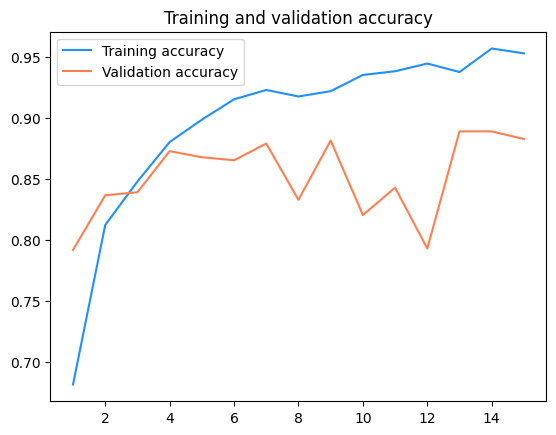

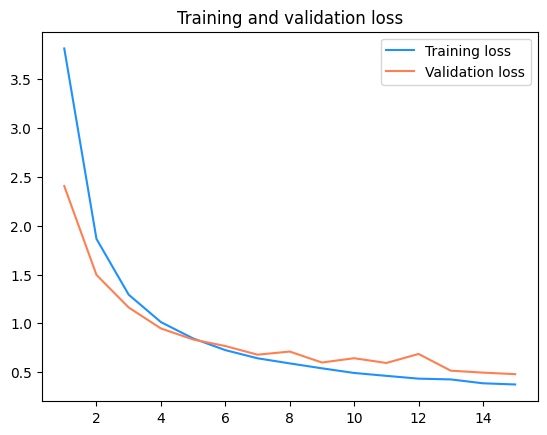

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/e88_26/model_epoch_13_val_accuracy_0.8890.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 2s 106ms/step - loss: 0.4989 - accuracy: 0.8983
Test loss: 0.4989, Test accuracy: 0.8983


19/19 [==============================] - 2s 104ms/step


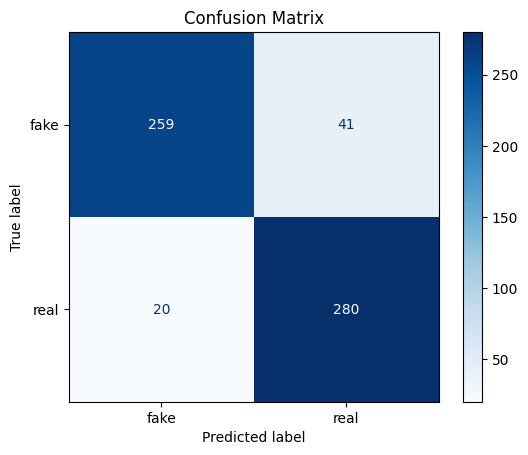

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

### Base model with 2 dense layers, no dropout, relu activation. Accuracy 0.79

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dense(256, activation='relu'),  # Add a second fully connected layer with 256 units and ReLU activation
    # Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/3/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/20
88/88 [==============================] - ETA: 0s - loss: 0.8517 - accuracy: 0.5675
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_01_val_accuracy_0.7232.h5
88/88 [==============================] - 45s 496ms/step - loss: 0.8517 - accuracy: 0.5675 - val_loss: 0.5528 - val_accuracy: 0.7232
Epoch 2/20
88/88 [==============================] - ETA: 0s - loss: 0.5934 - accuracy: 0.6680
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_02_val_accuracy_0.7207.h5
88/88 [==============================] - 44s 496ms/step - loss: 0.5934 - accuracy: 0.6680 - val_loss: 0.5407 - val_accuracy: 0.7207
Epoch 3/20
88/88 [==============================] - ETA: 0s - loss: 0.5458 - accuracy: 0.7294
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_03_val_accuracy_0.7880.h5
88/88 [==============================] - 44s 501ms/step - loss: 0.5458 - accuracy: 0.7294 - val_loss: 0.4565 - val_accuracy: 0.7880
E

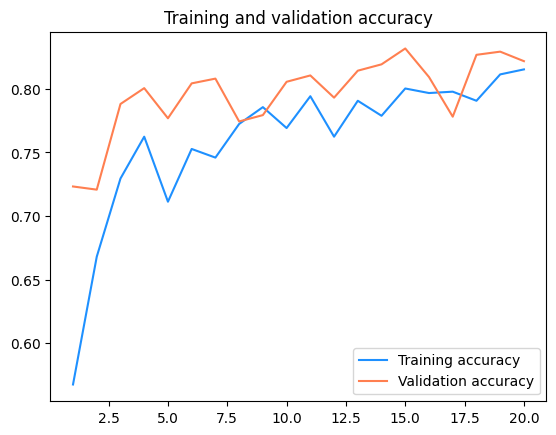

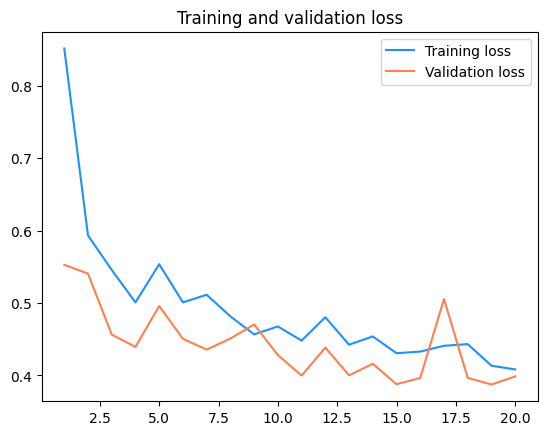

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/3/Relu/model_epoch_20_val_accuracy_0.8217.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')


Found 600 files belonging to 2 classes.
19/19 [==============================] - 4s 173ms/step - loss: 0.4567 - accuracy: 0.7950
Test loss: 0.4567, Test accuracy: 0.7950


30/30 [==============================] - 10s 322ms/step


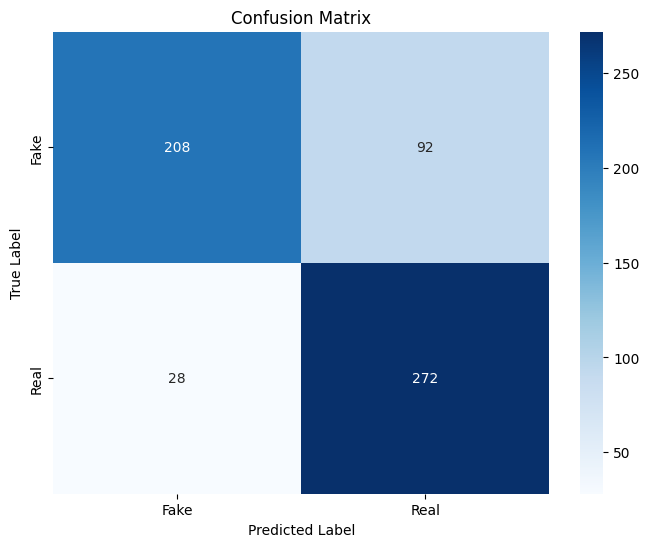

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get the true labels and predictions
true_labels = test_generator.classes
predictions = model.predict(test_generator)
predicted_labels = np.where(predictions > 0.5, 1, 0).flatten()

# Compute the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

def plot_confusion_matrix(conf_matrix, class_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Plot the confusion matrix
class_names = ['Fake', 'Real']  # Adjust based on your classes
plot_confusion_matrix(conf_matrix, class_names)

### Base model with 2 dense layers, no dropout, Leaky Relu activation. Accuracy 0.8

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='leaky_relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dense(256, activation='leaky_relu'),  # Add a second fully connected layer with 256 units and ReLU activation
    # Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 25
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/3/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/25
88/88 [==============================] - ETA: 0s - loss: 0.8248 - accuracy: 0.6036
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_01_val_accuracy_0.7282.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 44s 488ms/step - loss: 0.8248 - accuracy: 0.6036 - val_loss: 0.5381 - val_accuracy: 0.7282
Epoch 2/25
88/88 [==============================] - ETA: 0s - loss: 0.6198 - accuracy: 0.6758
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_02_val_accuracy_0.7531.h5
88/88 [==============================] - 44s 502ms/step - loss: 0.6198 - accuracy: 0.6758 - val_loss: 0.5045 - val_accuracy: 0.7531
Epoch 3/25
88/88 [==============================] - ETA: 0s - loss: 0.5810 - accuracy: 0.7012
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_03_val_accuracy_0.6983.h5
88/88 [==============================] - 44s 495ms/step - loss: 0.5810 - accuracy: 0.7012 - val_loss: 0.5940 - val_accuracy: 0.6983
Epoch 4/25
88/88 [==============================] - ETA: 0s - loss: 0.5664 - accuracy: 0.7069
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/3/model_epoch_04_val_accuracy_0.7880.h5
8

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/3/Leaky Relu/model_epoch_21_val_accuracy_0.8354.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    seed=123,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
19/19 [==============================] - 4s 185ms/step - loss: 0.4404 - accuracy: 0.8067
Test loss: 0.4404, Test accuracy: 0.8067


### Base model with 3 dense layers, no dropout, Leaky Relu activation. Accuracy 0.8



In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(512, activation='leaky_relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dense(256, activation='leaky_relu'),  # Add a second fully connected layer with 256 units and ReLU activation
    Dense(128, activation='leaky_relu'),  # Add a third fully connected layer with 256 units and ReLU activation
    # Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 25
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/4/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/25
88/88 [==============================] - ETA: 0s - loss: 1.0137 - accuracy: 0.6097
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/4/model_epoch_01_val_accuracy_0.5798.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 45s 492ms/step - loss: 1.0137 - accuracy: 0.6097 - val_loss: 0.9704 - val_accuracy: 0.5798
Epoch 2/25
88/88 [==============================] - ETA: 0s - loss: 0.6003 - accuracy: 0.6855
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/4/model_epoch_02_val_accuracy_0.7057.h5
88/88 [==============================] - 44s 500ms/step - loss: 0.6003 - accuracy: 0.6855 - val_loss: 0.5479 - val_accuracy: 0.7057
Epoch 3/25
88/88 [==============================] - ETA: 0s - loss: 0.6298 - accuracy: 0.6844
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/4/model_epoch_03_val_accuracy_0.7793.h5
88/88 [==============================] - 44s 502ms/step - loss: 0.6298 - accuracy: 0.6844 - val_loss: 0.4696 - val_accuracy: 0.7793
Epoch 4/25
88/88 [==============================] - ETA: 0s - loss: 0.5476 - accuracy: 0.7252
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/4/model_epoch_04_val_accuracy_0.6758.h5
8

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/4/model_epoch_23_val_accuracy_0.8055.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 3s 160ms/step - loss: 0.4289 - accuracy: 0.8083
Test loss: 0.4289, Test accuracy: 0.8083


19/19 [==============================] - 3s 166ms/step


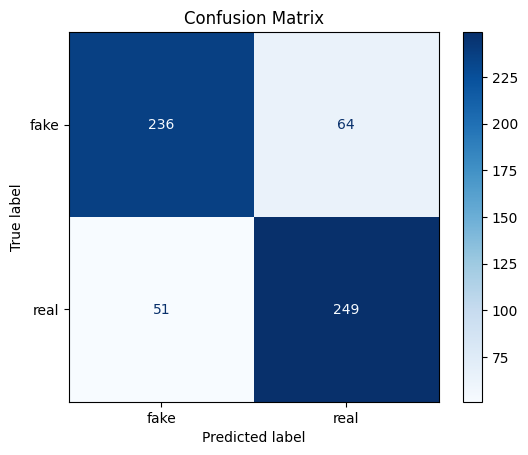

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

### Base model with 3 dense layers, no dropout, Relu activation. Accuracy 0.79

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(512, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dense(256, activation='relu'),  # Add a second fully connected layer with 256 units and ReLU activation
    Dense(128, activation='relu'),  # Add a third fully connected layer with 256 units and ReLU activation
    # Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 25
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/5/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/25
88/88 [==============================] - ETA: 0s - loss: 0.8137 - accuracy: 0.6004
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/5/model_epoch_01_val_accuracy_0.7369.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 45s 492ms/step - loss: 0.8137 - accuracy: 0.6004 - val_loss: 0.5351 - val_accuracy: 0.7369
Epoch 2/25
88/88 [==============================] - ETA: 0s - loss: 0.6196 - accuracy: 0.6791
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/5/model_epoch_02_val_accuracy_0.6284.h5
88/88 [==============================] - 44s 498ms/step - loss: 0.6196 - accuracy: 0.6791 - val_loss: 0.6872 - val_accuracy: 0.6284
Epoch 3/25
88/88 [==============================] - ETA: 0s - loss: 0.5467 - accuracy: 0.7230
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/5/model_epoch_03_val_accuracy_0.7805.h5
88/88 [==============================] - 44s 501ms/step - loss: 0.5467 - accuracy: 0.7230 - val_loss: 0.4702 - val_accuracy: 0.7805
Epoch 4/25
88/88 [==============================] - ETA: 0s - loss: 0.5024 - accuracy: 0.7616
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/5/model_epoch_04_val_accuracy_0.7756.h5
8

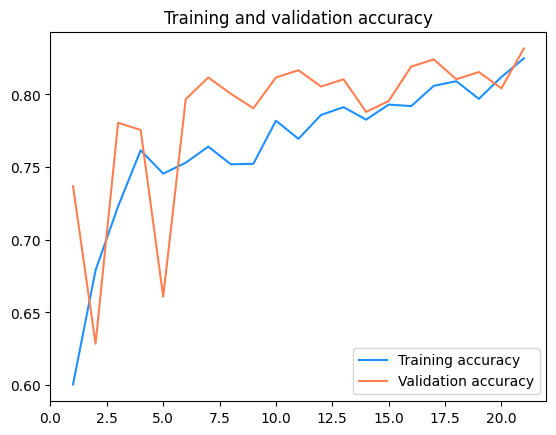

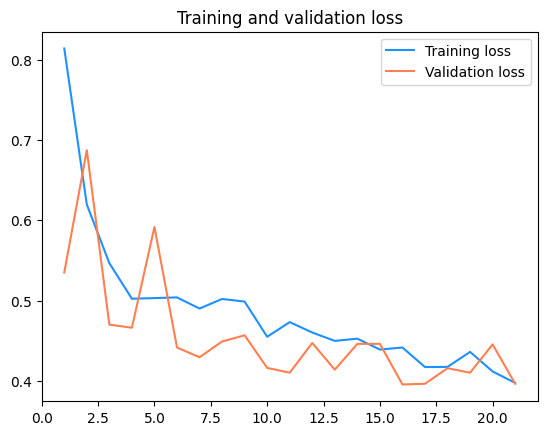

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/5/model_epoch_21_val_accuracy_0.8317.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 4s 182ms/step - loss: 0.4356 - accuracy: 0.7917
Test loss: 0.4356, Test accuracy: 0.7917


19/19 [==============================] - 3s 164ms/step


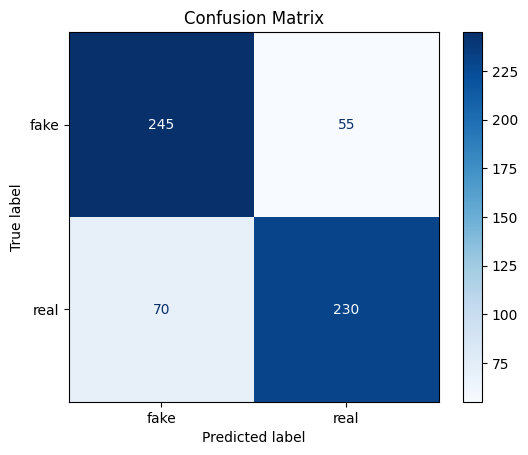

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

## Xception model, good training, bad testing

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint

from keras.applications import Xception


# Load the Xception model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/Xception2/4/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[model_checkpoint]
)

Epoch 1/20
88/88 [==============================] - ETA: 0s - loss: 1.3869 - accuracy: 0.7678 
Epoch 1: saving model to /content/drive/My Drive/checkpoints/Xception2/4/model_epoch_01_val_accuracy_0.8653.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 1774s 20s/step - loss: 1.3869 - accuracy: 0.7678 - val_loss: 0.3541 - val_accuracy: 0.8653
Epoch 2/20
88/88 [==============================] - ETA: 0s - loss: 0.3445 - accuracy: 0.8596
Epoch 2: saving model to /content/drive/My Drive/checkpoints/Xception2/4/model_epoch_02_val_accuracy_0.9052.h5
88/88 [==============================] - 46s 522ms/step - loss: 0.3445 - accuracy: 0.8596 - val_loss: 0.2585 - val_accuracy: 0.9052
Epoch 3/20
88/88 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.8710
Epoch 3: saving model to /content/drive/My Drive/checkpoints/Xception2/4/model_epoch_03_val_accuracy_0.9102.h5
88/88 [==============================] - 47s 530ms/step - loss: 0.3166 - accuracy: 0.8710 - val_loss: 0.2341 - val_accuracy: 0.9102
Epoch 4/20
88/88 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.8807
Epoch 4: saving model to /content/drive/My Drive/checkpoints/Xception2/4/model_epoch_04_val_accuracy

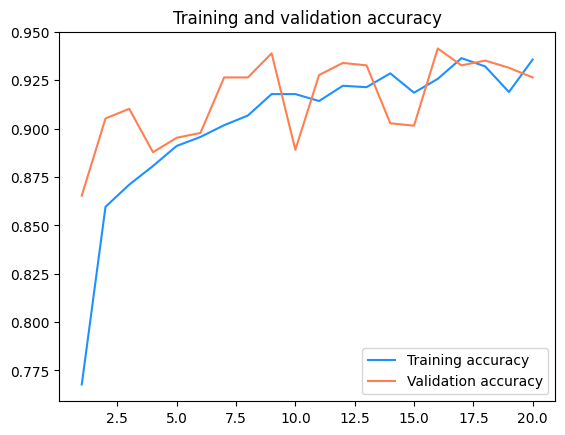

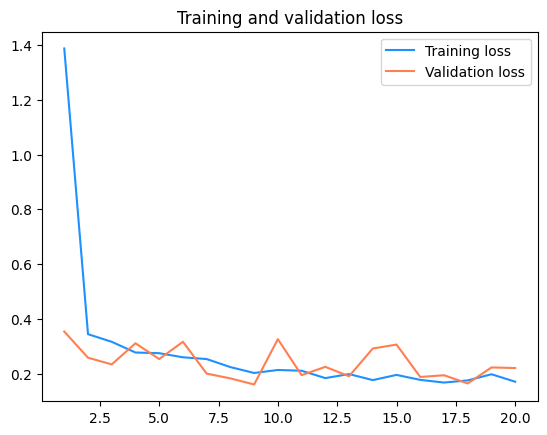

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/Xception2/4/model_epoch_18_val_accuracy_0.9352.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 3s 132ms/step - loss: 0.8759 - accuracy: 0.8167
Test loss: 0.8759, Test accuracy: 0.8167


19/19 [==============================] - 3s 133ms/step


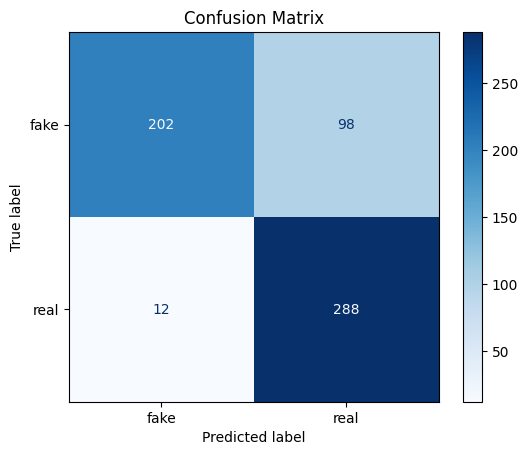

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

## Xception Model with regularization


In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint

from keras.applications import Xception


# Load the Xception model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.01)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.001))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/Xception2/5/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 88,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[model_checkpoint]
)

Epoch 1/20
88/88 [==============================] - ETA: 0s - loss: 4.2455 - accuracy: 0.6927
Epoch 1: saving model to /content/drive/My Drive/checkpoints/Xception2/5/model_epoch_01_val_accuracy_0.8678.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


88/88 [==============================] - 47s 504ms/step - loss: 4.2455 - accuracy: 0.6927 - val_loss: 1.2047 - val_accuracy: 0.8678
Epoch 2/20
88/88 [==============================] - ETA: 0s - loss: 0.8975 - accuracy: 0.8185
Epoch 2: saving model to /content/drive/My Drive/checkpoints/Xception2/5/model_epoch_02_val_accuracy_0.8928.h5
88/88 [==============================] - 45s 509ms/step - loss: 0.8975 - accuracy: 0.8185 - val_loss: 0.5920 - val_accuracy: 0.8928
Epoch 3/20
88/88 [==============================] - ETA: 0s - loss: 0.6617 - accuracy: 0.8149
Epoch 3: saving model to /content/drive/My Drive/checkpoints/Xception2/5/model_epoch_03_val_accuracy_0.8990.h5
88/88 [==============================] - 45s 506ms/step - loss: 0.6617 - accuracy: 0.8149 - val_loss: 0.4650 - val_accuracy: 0.8990
Epoch 4/20
88/88 [==============================] - ETA: 0s - loss: 0.5605 - accuracy: 0.8289
Epoch 4: saving model to /content/drive/My Drive/checkpoints/Xception2/5/model_epoch_04_val_accuracy

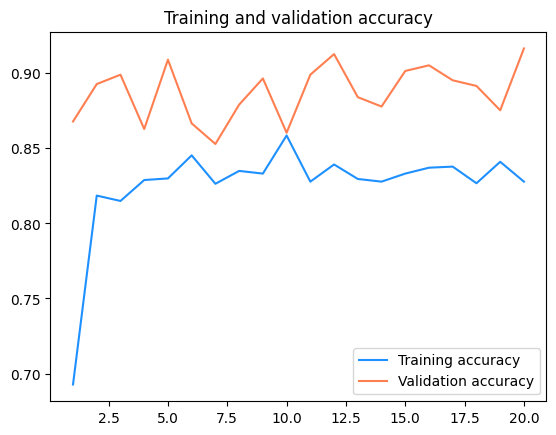

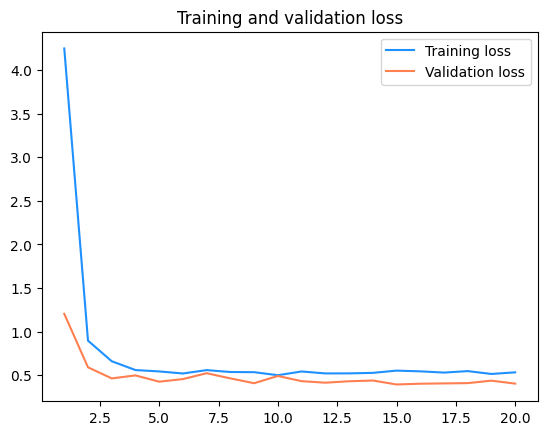

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/Xception2/5/model_epoch_10_val_accuracy_0.8603.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 4s 167ms/step - loss: 0.8260 - accuracy: 0.7683
Test loss: 0.8260, Test accuracy: 0.7683


## Xception with more training data

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint

from keras.applications import Xception


# Load the Xception model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/Xception2/7/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=Validation_generator,
    callbacks=[model_checkpoint]
)

83683744/83683744 [==============================] - 0s 0us/step
Epoch 1/20
107/107 [==============================] - ETA: 0s - loss: 1.4995 - accuracy: 0.7296
Epoch 1: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_01_val_accuracy_0.8716.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


107/107 [==============================] - 1216s 11s/step - loss: 1.4995 - accuracy: 0.7296 - val_loss: 0.3138 - val_accuracy: 0.8716
Epoch 2/20
107/107 [==============================] - ETA: 0s - loss: 0.4202 - accuracy: 0.8191
Epoch 2: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_02_val_accuracy_0.8853.h5
107/107 [==============================] - 73s 678ms/step - loss: 0.4202 - accuracy: 0.8191 - val_loss: 0.3114 - val_accuracy: 0.8853
Epoch 3/20
107/107 [==============================] - ETA: 0s - loss: 0.4050 - accuracy: 0.8267
Epoch 3: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_03_val_accuracy_0.9015.h5
107/107 [==============================] - 73s 679ms/step - loss: 0.4050 - accuracy: 0.8267 - val_loss: 0.2703 - val_accuracy: 0.9015
Epoch 4/20
107/107 [==============================] - ETA: 0s - loss: 0.3769 - accuracy: 0.8355
Epoch 4: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_04_

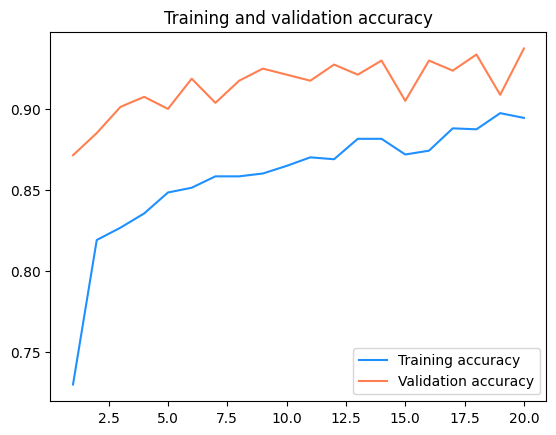

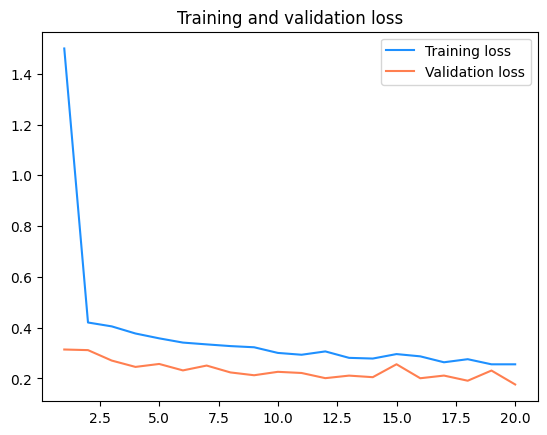

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/Xception2/7/model_epoch_16_val_accuracy_0.9302.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 2s 77ms/step - loss: 0.3780 - accuracy: 0.8450
Test loss: 0.3780, Test accuracy: 0.8450


19/19 [==============================] - 2s 74ms/step


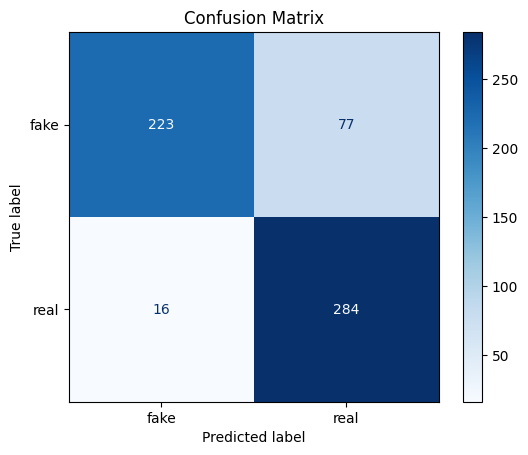

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

## Xception with more data, no dropout

> Add blockquote



Model is underftting a bit so we will remove dropout

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint

from keras.applications import Xception


# Load the Xception model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu'),  # Add a fully connected layer with 256 units and ReLU activation
    # Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid')  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/Xception2/7/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=Validation_generator,
    callbacks=[model_checkpoint]
)

Epoch 1/20
107/107 [==============================] - ETA: 0s - loss: 0.9787 - accuracy: 0.7549
Epoch 1: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_01_val_accuracy_0.8915.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


107/107 [==============================] - 76s 685ms/step - loss: 0.9787 - accuracy: 0.7549 - val_loss: 0.3394 - val_accuracy: 0.8915
Epoch 2/20
107/107 [==============================] - ETA: 0s - loss: 0.4044 - accuracy: 0.8258
Epoch 2: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_02_val_accuracy_0.8953.h5
107/107 [==============================] - 73s 681ms/step - loss: 0.4044 - accuracy: 0.8258 - val_loss: 0.2496 - val_accuracy: 0.8953
Epoch 3/20
107/107 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.8514
Epoch 3: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_03_val_accuracy_0.8865.h5
107/107 [==============================] - 73s 680ms/step - loss: 0.3566 - accuracy: 0.8514 - val_loss: 0.2968 - val_accuracy: 0.8865
Epoch 4/20
107/107 [==============================] - ETA: 0s - loss: 0.3536 - accuracy: 0.8482
Epoch 4: saving model to /content/drive/My Drive/checkpoints/Xception2/7/model_epoch_04_

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/Xception2/7/model_epoch_14_val_accuracy_0.9115.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 2s 76ms/step - loss: 0.3417 - accuracy: 0.8467
Test loss: 0.3417, Test accuracy: 0.8467


19/19 [==============================] - 2s 74ms/step


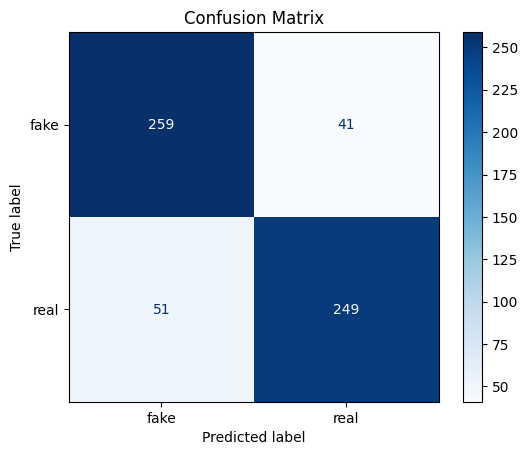

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# LIME verification

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_05_val_accuracy_0.9000.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 4s 180ms/step - loss: 0.4699 - accuracy: 0.8750
Test loss: 0.4699, Test accuracy: 0.8750


19/19 [==============================] - 3s 160ms/step


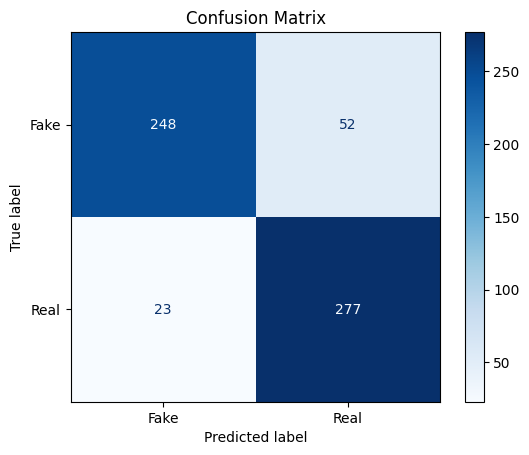

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import os
import numpy as np

# Placeholder: You need to create this list based on your actual directory structure
# For example: ['/path/to/image1.jpg', '/path/to/image2.jpg', ...]
image_paths = [os.path.join(dp, f) for dp, dn, filenames in os.walk(test_dir) for f in filenames if os.path.splitext(f)[1].lower() in ['.jpg', '.jpeg', '.png']]
image_paths.sort()  # Make sure this list is in the same order as your dataset

# Predictions
predictions = model.predict(test_ds)
predicted_classes = predictions.round().astype(int).flatten()

# Assuming you can access the actual labels in the correct order
# If your dataset is not shuffled and you have a binary classification (e.g., 0 and 1)
actual_labels = [label for _, label in test_ds.unbatch().as_numpy_iterator()]

# Lists for FP and FN images
false_positives = []
false_negatives = []

# Compare predictions with actual labels
for i, (predicted, actual) in enumerate(zip(predicted_classes, actual_labels)):
    if predicted != actual:  # Misclassification
        if predicted < 0.5:  # False positive (predicted Fake, actual Real)
            false_positives.append(image_paths[i])
        else:  # False negative (predicted Real, actual Fake)
            false_negatives.append(image_paths[i])


print("False Negatives:", false_negatives)
print("False Positives:", false_positives)

print( len(false_negatives))
print(len(false_positives))

19/19 [==============================] - 3s 162ms/step
False Negatives: ['/content/drive/My Drive/Sample/test/fake/photo_1088.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1113.jpg', '/content/drive/My Drive/Sample/test/fake/photo_119.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1220.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1229.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1241.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1266.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1323.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1403.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1489.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1564.jpg', '/content/drive/My Drive/Sample/test/fake/photo_161.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1623.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1703.jpg', '/content/drive/My Drive/Sample/test/fake/photo_1712.jpg', '/content/drive/My Drive/Sample/test/fake/ph

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=c92f2a46ca590500d480337c7c8fd4ad0ecc1c4e84a27cc744b1a720cdde4e4d
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from keras.applications.xception import preprocess_input, decode_predictions
from keras.preprocessing import image
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
import tensorflow as tf
from lime import lime_image
import time
import cv2
from skimage.segmentation import mark_boundaries

In [ ]:
# Load your model
model = load_model('/content/drive/My Drive/checkpoints/VGG19/e40_5/model_epoch_05_val_accuracy_0.9000.h5')

In [ ]:
def custom_preprocess_input(images):
    return images / 255.0  # Scale pixel values to [0, 1]

# Update the predict_fn to use the custom preprocessing
def predict_fn(images):
    processed_images = custom_preprocess_input(images)
    return model.predict(processed_images)

In [ ]:
from keras.preprocessing import image
import numpy as np
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
from lime import lime_image

# Initialize the LIME Image Explainer
explainer = lime_image.LimeImageExplainer()

# Assuming 'predict_fn' is your model's prediction function and 'model' is your loaded model

def process_single_image(image_path, explainer, predict_fn, model):
    """
    Process a single image, generating an explanation and prediction.

    Parameters:
    - image_path: Path to the image file
    - explainer: LIME Image Explainer instance
    - predict_fn: Prediction function of the model
    - model: Trained model

    Returns:
    - annotated_image: Image annotated with explanation
    - predicted_class: Predicted class of the image ('Real' or 'Fake')
    """
    # Load the image and convert it to a numpy array
    img = image.load_img(image_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    # Generate an explanation for the image using LIME
    explanation = explainer.explain_instance(
        img_array[0].astype('double'),
        predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=1000
    )

    # Visualize the explanation
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )
    annotated_image = mark_boundaries(temp, mask)

    # Get the model's prediction
    prediction = model.predict(img_array)
    predicted_class = 'Real' if prediction[0][0] > 0.5 else 'Fake'

    return annotated_image, predicted_class

In [ ]:
def process_image_list(image_paths, explainer, predict_fn, model):
    """
    Process a list of images, displaying their explanations and predictions in rows of 4, up to a maximum of 16 images.

    Parameters:
    - image_paths: List of paths to the image files
    - explainer: LIME Image Explainer instance
    - predict_fn: Prediction function of the model
    - model: Trained model
    """
    # Track the number of images processed
    count = 0

    # Prepare a new figure
    plt.figure(figsize=(20, 20))

    # Limit the number of images processed to 16
    for image_path in image_paths[:16]:  # Only process the first 16 images
        annotated_image, predicted_class = process_single_image(image_path, explainer, predict_fn, model)

        # Display the annotated image with the prediction
        count += 1
        plt.subplot(4, 4, count)  # Arrange images in 4x4 grid
        plt.imshow(annotated_image)
        plt.title(f'Class: {predicted_class}')
        plt.axis('off')

        if count == 16:
            break  # Stop after displaying 16 images

    plt.tight_layout()
    plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


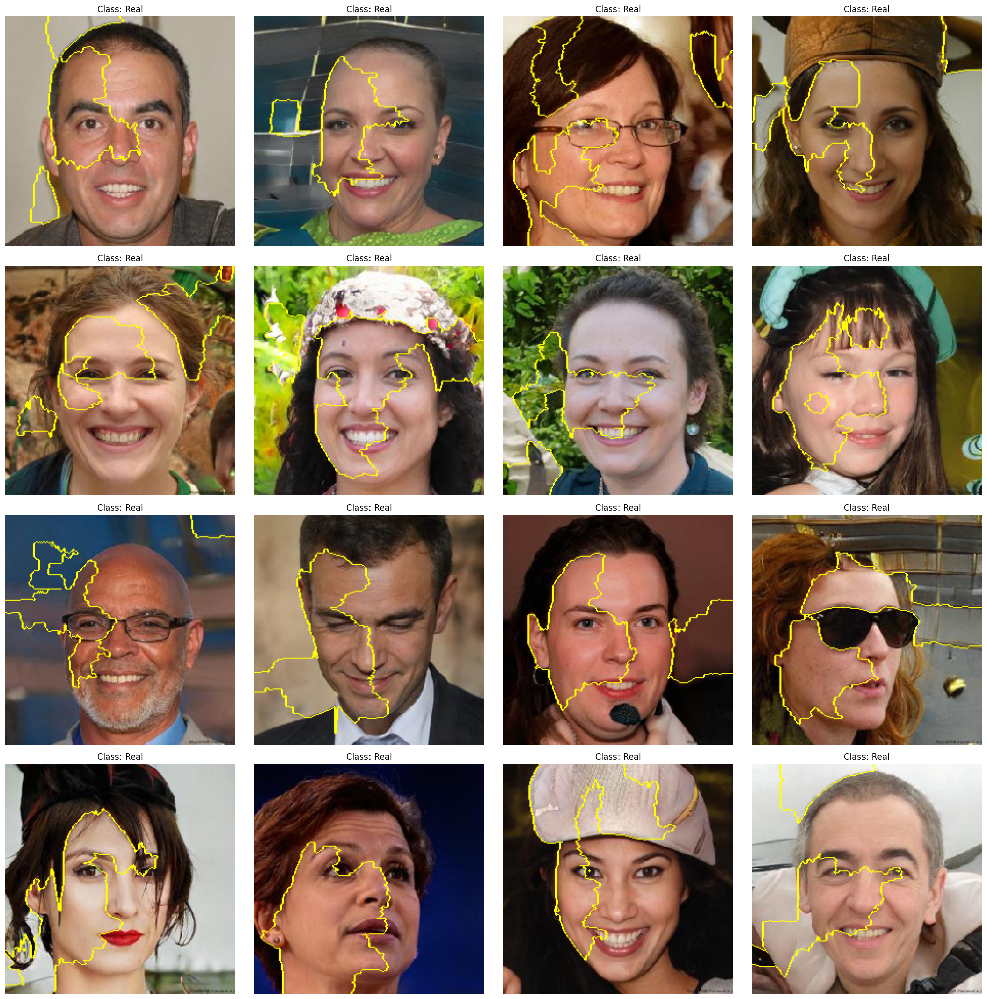

In [ ]:
#false_negatives
process_image_list(false_negatives, explainer, predict_fn, model)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


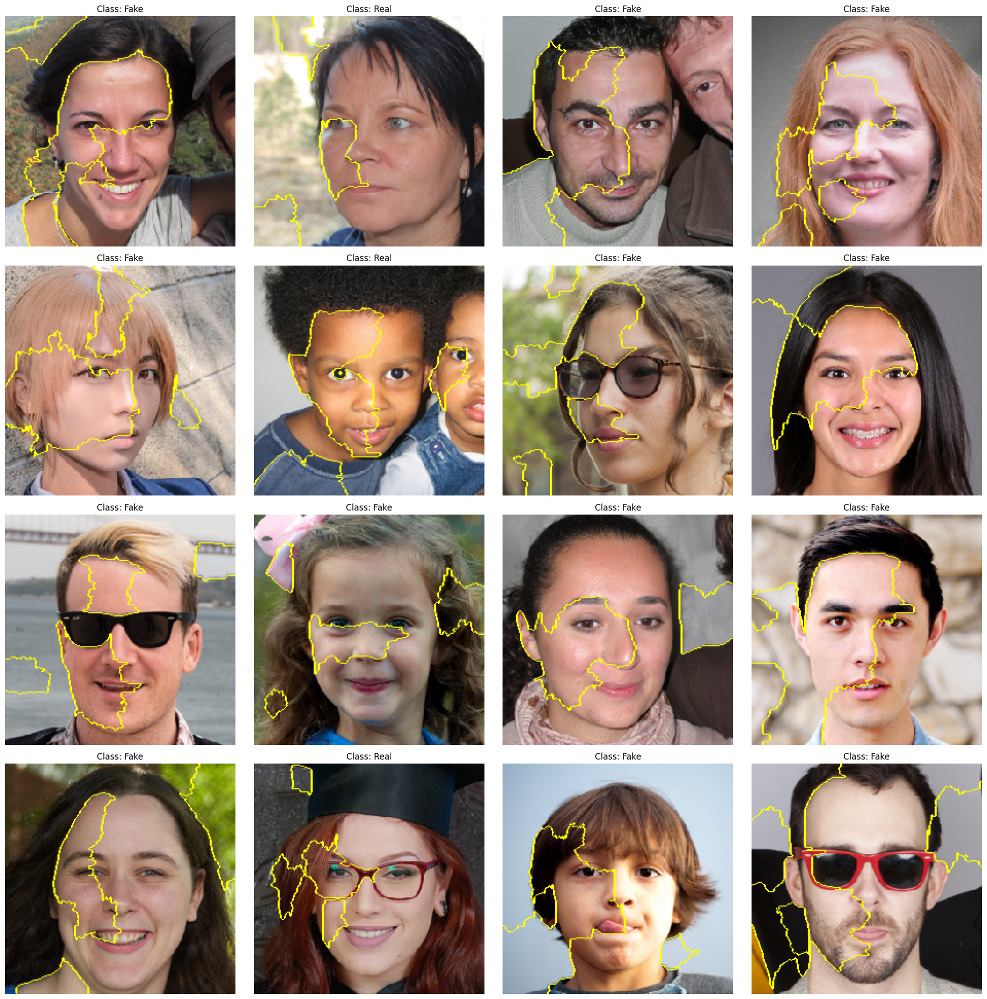

In [ ]:
#false_psitives
process_image_list(false_positives, explainer, predict_fn, model)

In [ ]:
from keras.preprocessing import image
import numpy as np

for image_to_explain in false_positives:

  # Load the image and convert it to a numpy array
  img = image.load_img(image_to_explain, target_size=(224, 224))
  img_array = image.img_to_array(img)
  img_array = np.expand_dims(img_array, axis=0)
  img_array = img_array / 255.0  # Rescale the image


  # Get the model's prediction
  prediction = model.predict(img_array)
  predicted_class = 'Real' if prediction[0][0] > 0.5 else 'Fake'
  print(f'Image: {image_to_explain}')
  print(f'Prediction: {prediction[0][0]}')
  print(f'Predicted class: {predicted_class}')

# Best model retraining with 600 aditional images

### First model, removed the early stoping to run all the 20 epochs. Accuracy 0.89


In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.001)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.001))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/6/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    steps_per_epoch= 106,
    epochs=num_epochs,
    validation_data=Validation_generator,
    validation_steps = 26,
    callbacks=[model_checkpoint])

Epoch 1/20
106/106 [==============================] - ETA: 0s - loss: 1.1426 - accuracy: 0.7152
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/6/model_epoch_01_val_accuracy_0.8304.h5
106/106 [==============================] - 41s 373ms/step - loss: 1.1426 - accuracy: 0.7152 - val_loss: 0.5796 - val_accuracy: 0.8304
Epoch 2/20
106/106 [==============================] - ETA: 0s - loss: 0.5386 - accuracy: 0.8218
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/6/model_epoch_02_val_accuracy_0.8616.h5
106/106 [==============================] - 40s 375ms/step - loss: 0.5386 - accuracy: 0.8218 - val_loss: 0.4674 - val_accuracy: 0.8616
Epoch 3/20
106/106 [==============================] - ETA: 0s - loss: 0.4327 - accuracy: 0.8666
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/6/model_epoch_03_val_accuracy_0.8541.h5
106/106 [==============================] - 40s 374ms/step - loss: 0.4327 - accuracy: 0.8666 - val_loss: 0.4359 - val_accura

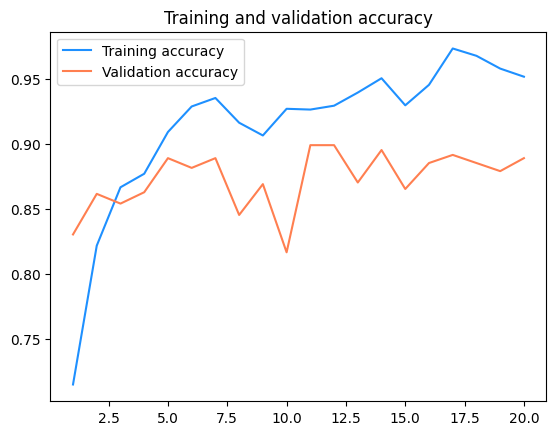

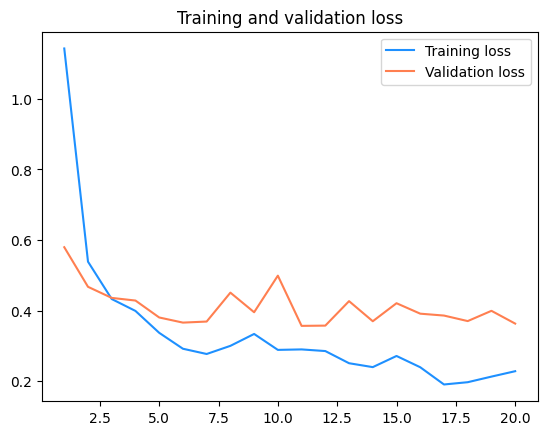

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/6/model_epoch_12_val_accuracy_0.8990.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 3s 131ms/step - loss: 0.3519 - accuracy: 0.8967
Test loss: 0.3519, Test accuracy: 0.8967


19/19 [==============================] - 2s 112ms/step


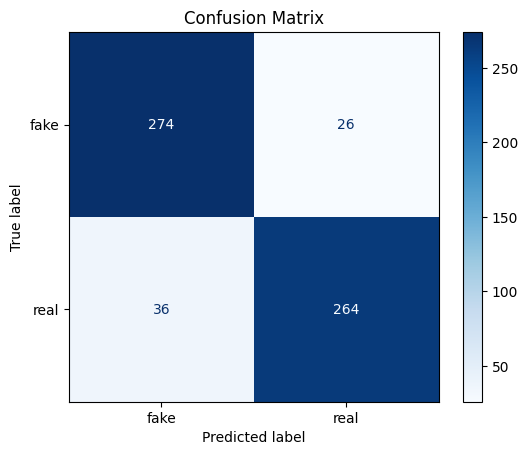

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

### Second model 0.90 accuracy

Here we added only fake images and don't consider new real images

In [ ]:
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint


# Load the VGG19 model pre-trained on ImageNet, excluding its top (fully connected) layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to prevent them from being updated during training
for layer in base_model.layers:
    layer.trainable = False


model = Sequential([
    base_model,
    Flatten(),  # Flatten the output of the base model to a 1D vector
    Dense(256, activation='relu', kernel_regularizer=l2(0.001)),  # Add a fully connected layer with 256 units and ReLU activation
    Dropout(0.2),  # Add dropout for regularization (reduce overfitting)
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.001))  # Add the output layer with sigmoid activation for binary classification
])

# Model compilation with Adam activation and binary_crossentropy loss function, good for binary classifications
# Metrics also included

model.compile(optimizer=Adam(learning_rate= 1e-3),
               loss='binary_crossentropy',
               metrics=['accuracy'])

# Model training
num_epochs = 20
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
checkpoint_path = '/content/drive/My Drive/checkpoints/VGG19/8/model_epoch_{epoch:02d}_val_accuracy_{val_accuracy:.4f}.h5'
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, save_best_only=False, monitor='val_accuracy', mode='max', verbose=1)


history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=Validation_generator,
    callbacks=[model_checkpoint])

Epoch 1/20
97/97 [==============================] - ETA: 0s - loss: 1.0642 - accuracy: 0.6860
Epoch 1: saving model to /content/drive/My Drive/checkpoints/VGG19/8/model_epoch_01_val_accuracy_0.8155.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


97/97 [==============================] - 233s 2s/step - loss: 1.0642 - accuracy: 0.6860 - val_loss: 0.5719 - val_accuracy: 0.8155
Epoch 2/20
97/97 [==============================] - ETA: 0s - loss: 0.5277 - accuracy: 0.8177
Epoch 2: saving model to /content/drive/My Drive/checkpoints/VGG19/8/model_epoch_02_val_accuracy_0.8628.h5
97/97 [==============================] - 27s 273ms/step - loss: 0.5277 - accuracy: 0.8177 - val_loss: 0.4696 - val_accuracy: 0.8628
Epoch 3/20
97/97 [==============================] - ETA: 0s - loss: 0.4161 - accuracy: 0.8651
Epoch 3: saving model to /content/drive/My Drive/checkpoints/VGG19/8/model_epoch_03_val_accuracy_0.8691.h5
97/97 [==============================] - 27s 275ms/step - loss: 0.4161 - accuracy: 0.8651 - val_loss: 0.4028 - val_accuracy: 0.8691
Epoch 4/20
97/97 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.8903
Epoch 4: saving model to /content/drive/My Drive/checkpoints/VGG19/8/model_epoch_04_val_accuracy_0.8603.h5
97/

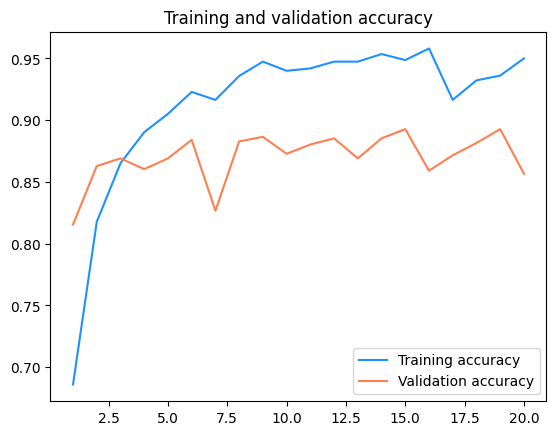

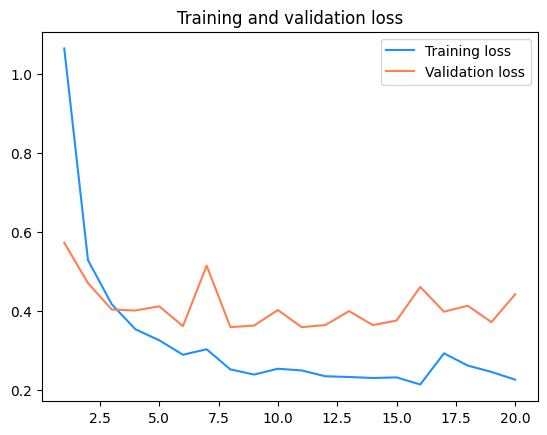

In [ ]:
# Plot the training and validation accuracy and loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'dodgerblue', label='Training accuracy')
plt.plot(epochs, val_acc, 'coral', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'dodgerblue', label='Training loss')
plt.plot(epochs, val_loss, 'coral', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras.models import load_model
from keras.layers.experimental.preprocessing import Rescaling

# Load the saved model
model_path = '/content/drive/My Drive/checkpoints/VGG19/8/model_epoch_08_val_accuracy_0.8828.h5'
model = load_model(model_path)

# Set the path to the test folder
test_dir = '/content/drive/My Drive/Sample/test'

# Define the batch size and image size
batch_size = 32
img_height = 224
img_width = 224

# Load the test data
test_ds = keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    shuffle=False)  # No need to shuffle the test data

class_names = test_ds.class_names
print("Class names:", class_names)

# Define the preprocessing layers
rescale_layer = Rescaling(1./255)

# Apply the rescaling layer to the test dataset
test_ds = test_ds.map(lambda x, y: (rescale_layer(x), y))

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test loss: {test_loss:.4f}, Test accuracy: {test_accuracy:.4f}')

Found 600 files belonging to 2 classes.
Class names: ['fake', 'real']
19/19 [==============================] - 2s 110ms/step - loss: 0.3370 - accuracy: 0.9067
Test loss: 0.3370, Test accuracy: 0.9067


19/19 [==============================] - 2s 108ms/step


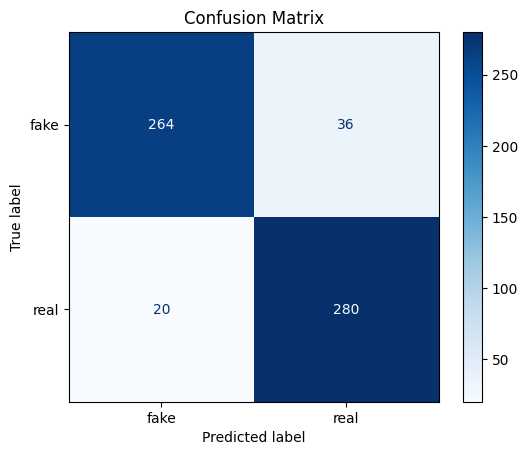

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Make predictions on the test set
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)

# Assuming a binary classification task, threshold the predictions at 0.5
y_pred_classes = (y_pred_probs > 0.5).astype(int).flatten()

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()